# Proyecto Multivariados

perplexity, local vs global

## Datos

#### Dataset info #

This is one of multiple ECoG datasets from Miller 2019, recorded in clinical settings with a variety of tasks. Raw data here:

https://exhibits.stanford.edu/data/catalog/zk881ps0522


This particular dataset has been used in the following publications:

*Miller, Kai J., et al. "Decoupling the cortical power spectrum reveals real-time representation of individual finger movements in humans." Journal of Neuroscience 29.10 (2009): 3132-3137.*

*Miller, Kai J., et al. "Human motor cortical activity is selectively phase-entrained on underlying rhythms." (2012): e1002655.*

`alldat` contain 3 sessions from 3 subjects, and was used in this paper:

https://pubmed.ncbi.nlm.nih.gov/17873429/

From the dataset readme:

*finger movement task, subjects were cued with a word displayed on a bedside monitor indicating which finger to move during 2- second movement trials. The subject performed self-paced movements in response to each of these cues, and they typically moved each finger 2–5 times during each trial, but some trials included many more movements.
"stim" (time x 1):
0 – Inter-stimulus interval
1 – thumb
2 – index finger
3 – middle finger
4 – ring finger
5 – little finger*

The motion of the fingers was captured with a dataglove, which was sampled at the same rate (1000Hz) as the voltage data. From the dataset readme:

*finger flexions, measured from the hand contralateral to grid placement. Note that they are in the raw form input. They are in 40ms blocks, and have non-zero offset. The 5 columns correspond to the digits thumb-index-middle-ring-little in order. Finger positions were recorded using a 5 degree-of-freedom dataglove sensor (5 dt, Irvine, CA).*

Sample rate is always 1000Hz, and the ECoG data has been notch-filtered at 60, 120, 180, 240 and 250Hz, followed by z-scoring across the entire recording and conversion to float16 to minimize size (please convert back to float32 for analysis).

Variables are:
* `dat['V']`: continuous voltage data (time by channels)
* `dat['locs`]: three-dimensional coordinates of the electrodes (n_channels by 3)
* `dat['dg']`: digit flexions (time x number of fingers). This was preprocessed from the original data to remove a moving baseline.
* `dat['srate']`: sampling rate (always 1000)
* `dat['t_on']`: time of cue onset
* `dat['t_off']`: time of cue offset (usually 2000ms after `t_on`)
* `dat['stim_id']`: cue identity (which finger to flex)
* `dat['stimtext']`: cue text on the screen

In [97]:
# @title Data retrieval
import os, requests

fname = 'fingerflex.npz'
url = "https://osf.io/5m47z/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [98]:
from matplotlib import rcParams
from matplotlib import pyplot as plt

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

In [99]:
# @title Data loading
import numpy as np

alldat = np.load(fname, allow_pickle=True)['dat']
# un arreglo de largo 1 tienen un arreglo de largo 3 con diccionarios 
# así nos quedamos con el arreglo de largo 3 con diccionarios
alldat = alldat[0]
dat = alldat[0]

print(f"Tenemos {alldat.size} sujetos")

Tenemos 3 sujetos


### Electrodos

In [100]:
from nilearn import plotting
from nimare import utils

plt.figure(figsize=(8, 8))
locs = alldat[0]['locs']
view = plotting.view_markers(utils.tal2mni(locs),
                             marker_labels=['%d'%k for k in np.arange(locs.shape[0])],
                             marker_color='purple',
                             marker_size=5)
view

<Figure size 800x800 with 0 Axes>

In [101]:
plt.figure(figsize=(8, 8))
locs = alldat[1]['locs']
view = plotting.view_markers(utils.tal2mni(locs),
                             marker_labels=['%d'%k for k in np.arange(locs.shape[0])],
                             marker_color='purple',
                             marker_size=5)
view

<Figure size 800x800 with 0 Axes>

In [102]:
plt.figure(figsize=(8, 8))
locs = alldat[2]['locs']
view = plotting.view_markers(utils.tal2mni(locs),
                             marker_labels=['%d'%k for k in np.arange(locs.shape[0])],
                             marker_color='purple',
                             marker_size=5)
view

<Figure size 800x800 with 0 Axes>

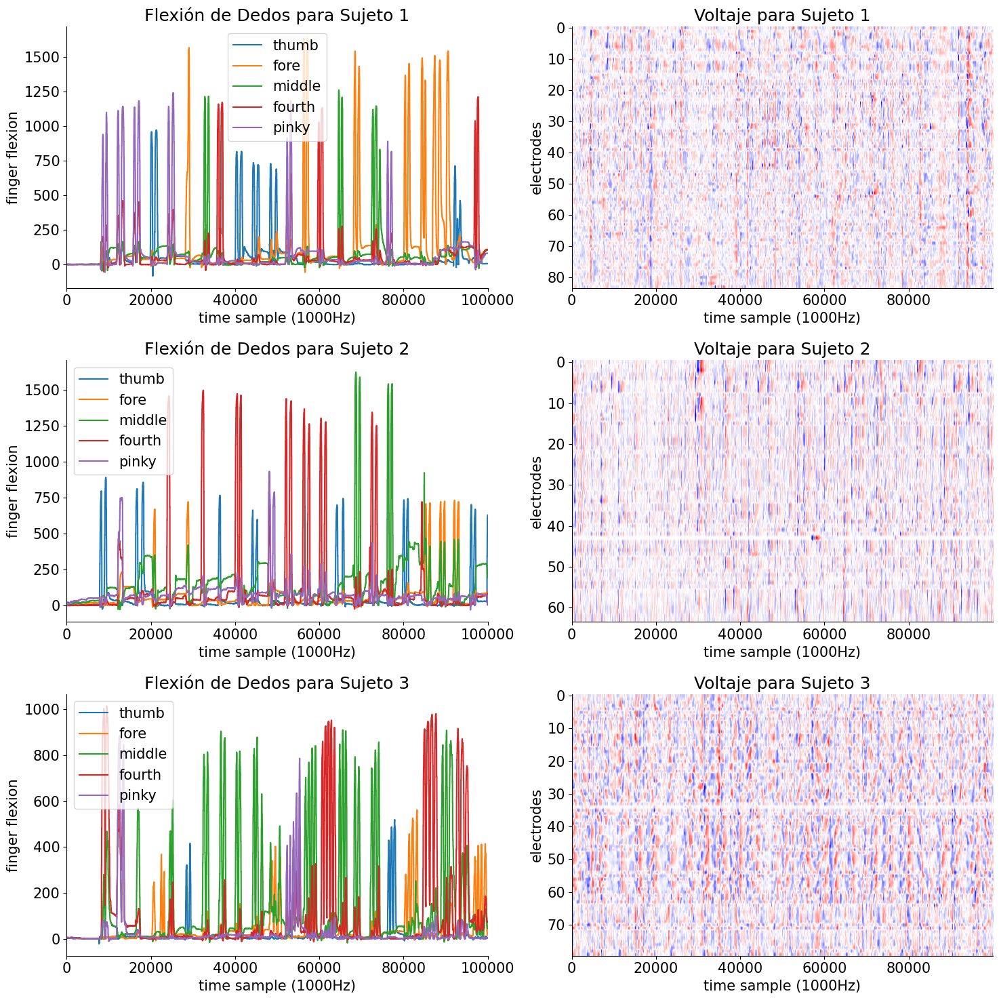

In [103]:
import matplotlib.pyplot as plt
# Crear un grid de 3x3 para las visualizaciones
fig, axes = plt.subplots(3, 2, figsize=(15, 15))

# Visualizar datos para cada sujeto
for i, dat in enumerate(alldat):
    dg = dat['dg']
    nfingers = dg.shape[1]
    
    # Visualización de la flexión de dedos
    ax = axes[i, 0]
    for j in range(dg.shape[-1]):
        ax.plot(dg[:100000, j])
    
    ax.set_xlabel('time sample (1000Hz)')
    ax.set_ylabel('finger flexion')
    ax.set_xlim([0, 100000])
    ax.legend(dat['stimtext'])
    ax.set_title(f'Flexión de Dedos para Sujeto {i+1}')
    
    # Datos de voltaje en el mismo periodo de tiempo
    V = dat['V'].astype('float32')
    ax = axes[i, 1]
    im = ax.imshow(V[:100000, :].T,
               aspect='auto',
               vmax=4,
               vmin=-4,
               cmap='bwr')
    
    ax.set_xlabel('time sample (1000Hz)')
    ax.set_ylabel('electrodes')
    ax.set_title(f'Voltaje para Sujeto {i+1}')
    
plt.tight_layout()
plt.show()

### Filtrado de Frecuencia

In [104]:
%%time
from scipy import signal

# Preprocesamiento de señales para todos los sujetos
for i, dat in enumerate(alldat):
    V = dat['V'].astype('float32')
    
    # Filtro de paso alto para eliminar frecuencias bajas (por debajo de 50 Hz)
    b, a = signal.butter(3, 50, btype='high', fs=1000)
    V = signal.filtfilt(b, a, V, 0)
    
    # Convertir a potencia de señal
    V = np.abs(V)**2
    
    # Filtro de paso bajo para suavizar la señal (por debajo de 3 Hz)
    b, a = signal.butter(3, 3, btype='low', fs=1000)
    V = signal.filtfilt(b, a, V, 0)
    
    # Guardar los datos preprocesados en la estructura original
    dat['V_preprocessed'] = V


CPU times: total: 8.72 s
Wall time: 16.4 s


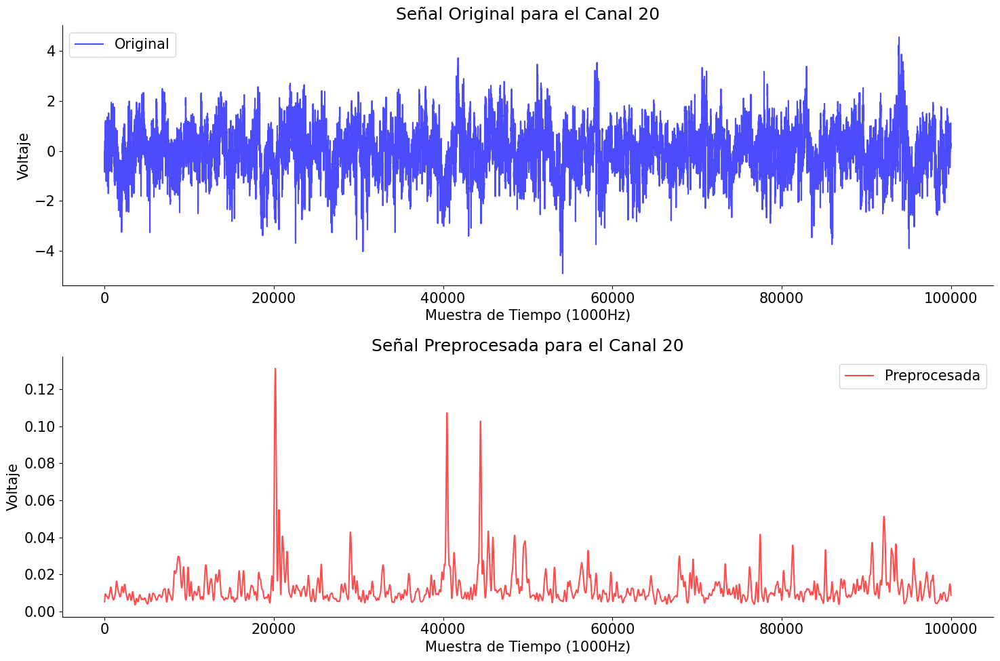

In [105]:
# Seleccionar un canal específico (por ejemplo, el canal 20)
channel = 20
time_samples = 100000  # Número de muestras de tiempo a visualizar

# Crear un grid con 2 filas y 1 columna
fig, axes = plt.subplots(2, 1, figsize=(15, 10))

# Señal original
axes[0].plot(alldat[0]['V'][:time_samples, channel], label='Original', alpha=0.7, color='blue')
axes[0].set_xlabel('Muestra de Tiempo (1000Hz)')
axes[0].set_ylabel('Voltaje')
axes[0].set_title(f'Señal Original para el Canal {channel}')
axes[0].legend()

# Señal preprocesada
axes[1].plot(alldat[0]['V_preprocessed'][:time_samples, channel], label='Preprocesada', alpha=0.7, color='red')
axes[1].set_xlabel('Muestra de Tiempo (1000Hz)')
axes[1].set_ylabel('Voltaje')
axes[1].set_title(f'Señal Preprocesada para el Canal {channel}')
axes[1].legend()

plt.tight_layout()
plt.show()

### Correlación entre señales preprocesadas

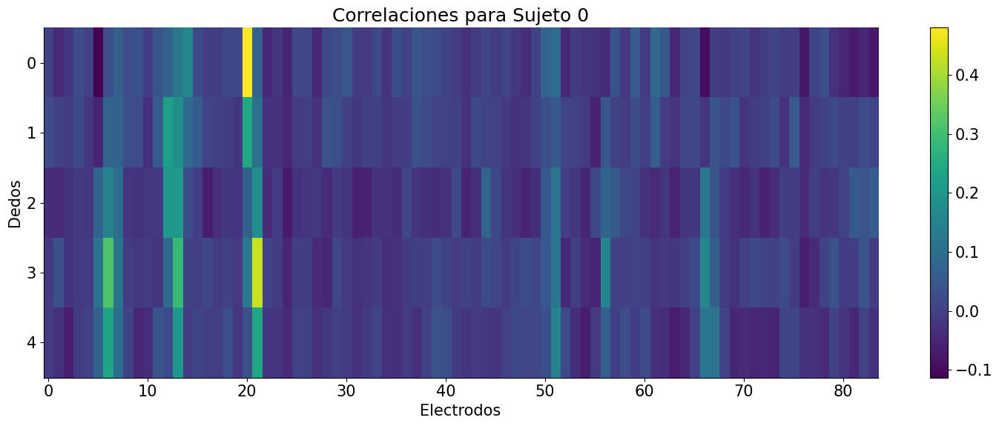

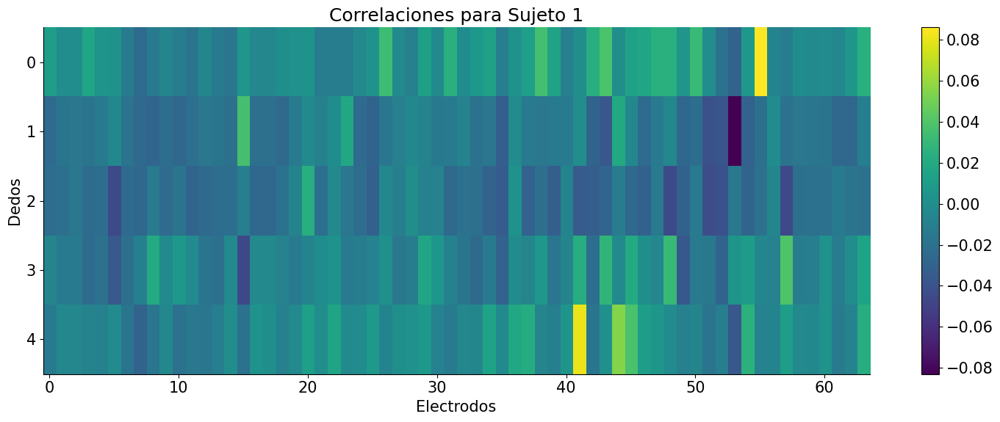

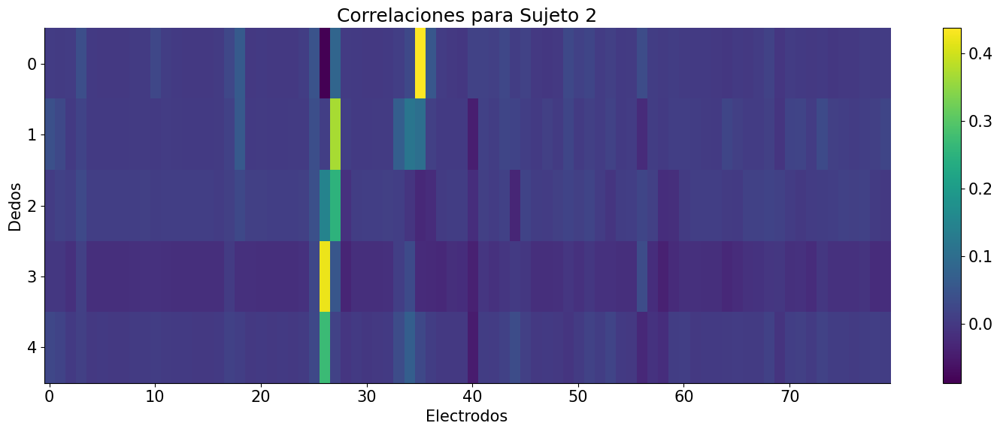

CPU times: total: 9.75 s
Wall time: 14 s


In [106]:
%%time
# Preprocesamiento de señales para todos los sujetos
for i, dat in enumerate(alldat):
    V = dat['V_preprocessed']
    dg = dat['dg']
    nfingers = dg.shape[1]
    nt, nchan = V.shape

    cc = np.zeros((nchan, nfingers))
    for j in range(nchan):
        for k in range(nfingers):
            cc[j, k] = np.corrcoef(V[:, j], dg[:, k])[0, 1]

    plt.figure(figsize=(15, 6))
    plt.imshow(cc.T, aspect='auto')
    plt.colorbar()
    plt.xlabel('Electrodos')
    plt.ylabel('Dedos')
    plt.title(f'Correlaciones para Sujeto {i}')
    plt.show()

In [107]:
%%time
import pandas as pd

# Inicializar una lista para almacenar las observaciones
data = []

# Iterar sobre todos los sujetos
for subject_id, dat in enumerate(alldat):
    V = dat['V']
    V_preprocessed = dat['V_preprocessed']
    dg = dat['dg']
    t_on = dat['t_on']
    t_off = dat['t_off']
    stim_id = dat['stim_id']
    
    # Iterar sobre todos los cues
    for i in range(len(t_on)):
        # Extraer el segmento de la señal durante el cue
        start = t_on[i]
        end = t_off[i]
        
        # Asegurarse de que los índices son enteros
        start = int(start)
        end = int(end)
        
        # Extraer la señal de voltaje y la señal de flexión de dedos para el segmento
        V_segment = V[start:end, :]
        dg_segment = dg[start:end, :]
        V_preprocessed_segment = V_preprocessed[start:end, :]
        
        # Crear una observación con toda la información relevante
        observation = {
            'subject': subject_id,
            'stim_id': stim_id[i],
            'V': V_segment,
            'dg': dg_segment,
            'V_preprocessed': V_preprocessed_segment
        }
        
        # Añadir la observación a la lista
        data.append(observation)

# Convertir la lista de observaciones en un DataFrame de pandas
df = pd.DataFrame(data)
df

CPU times: total: 172 ms
Wall time: 228 ms


,subject,stim_id,V,dg,V_preprocessed
0,0,5,"[[-0.01025, -0.0871, 0.04306, 0.1816, -0.707, ...","[[1.0, 2.0, 2.0, 1.0, 0.0], [1.0, 2.0, 2.0, 1....","[[0.006731084950751146, 0.002257720094176623, ..."
1,0,5,"[[-0.177, -0.2876, 0.07544, 0.1895, 0.3037, 0....","[[2.0, 36.0, 122.0, 9.0, 0.0], [2.0, 36.0, 122...","[[0.004354213243907625, 0.0018563630848983236,..."
2,0,5,"[[-1.365, 0.9497, 0.0689, 0.0918, -1.464, -0.9...","[[16.0, 60.0, 77.0, 3.0, 27.0], [16.0, 60.0, 7...","[[0.008742187758238663, 0.003457486939732531, ..."
3,0,1,"[[-0.3464, 0.7417, 0.9146, 1.17, 0.1941, -0.37...","[[44.0, 39.0, 53.0, 0.0, 52.0], [44.0, 39.0, 5...","[[0.00421649839000787, 0.0040001668756106615, ..."
4,0,5,"[[0.3442, -0.313, -0.5215, -1.045, -0.7725, 0....","[[47.0, 17.0, 133.0, 31.0, 9.0], [47.0, 17.0, ...","[[0.0036529056903043273, 0.003316106786961743,..."
...,...,...,...,...,...
405,2,3,"[[-0.03857, 0.502, 0.2104, 0.7744, -0.6226, -2...","[[0.0, 1.0, 0.0, 2.0, 0.0], [0.0, 1.0, 0.0, 2....","[[0.00764382774334796, 0.02064491755229973, 0...."
406,2,5,"[[0.2458, -0.007088, -1.508, -1.801, 1.051, -0...","[[-20.0, 260.0, 33.0, 479.0, 353.0], [0.0, 260...","[[0.017938702121421377, 0.0383926242430772, 0...."
407,2,3,"[[-1.474, 0.2651, 0.62, 1.344, -0.617, 0.567, ...","[[62.0, 387.0, 76.0, 611.0, 477.0], [62.0, 387...","[[0.030677268141299438, 0.03174991293925156, 0..."
408,2,4,"[[-1.951, -1.415, -1.924, -2.309, -2.096, -0.9...","[[40.0, 15.0, 59.0, 24.0, -4.0], [40.0, 15.0, ...","[[0.10105765948144241, 0.13231091903095898, 0...."


In [108]:
# Verificar las formas de las observaciones para V_preprocessed y dg
v_shapes = df['V_preprocessed'].apply(lambda x: x.shape).unique()
dg_shapes = df['dg'].apply(lambda x: x.shape).unique()

print(f"Formas únicas en V_preprocessed: {v_shapes}")
print(f"Formas únicas en dg: {dg_shapes}")

# Verificar si todas las formas son iguales
if len(v_shapes) == 1 and len(dg_shapes) == 1:
    print("Todas las observaciones tienen la misma forma.")
else:
    print("Las observaciones tienen diferentes formas.")

Formas únicas en V_preprocessed: [(2000, 84) (2000, 64) (2000, 80) (1759, 80)]
Formas únicas en dg: [(2000, 5) (1759, 5)]
Las observaciones tienen diferentes formas.


In [109]:
# Identificar las formas más comunes
common_v_shape = df['V_preprocessed'].apply(lambda x: x.shape).mode()[0]
common_dg_shape = df['dg'].apply(lambda x: x.shape).mode()[0]

print(f"Forma más común en V_preprocessed: {common_v_shape}")
print(f"Forma más común en dg: {common_dg_shape}")

Forma más común en V_preprocessed: (2000, 64)
Forma más común en dg: (2000, 5)


In [110]:
# Contar las formas únicas de V_preprocessed
v_pr_shape_counts = df['V_preprocessed'].apply(lambda x: x.shape).value_counts()
v_shape_counts = df['V'].apply(lambda x: x.shape).value_counts()

# Contar las formas únicas de dg
dg_shape_counts = df['dg'].apply(lambda x: x.shape).value_counts()

print("Conteo de formas en V:")
print(v_shape_counts)

print("Conteo de formas en V_preprocessed:")
print(v_shape_counts)

print("\nConteo de formas en dg:")
print(dg_shape_counts)

Conteo de formas en V:
V
(2000, 84)    150
(2000, 64)    150
(2000, 80)    109
(1759, 80)      1
Name: count, dtype: int64
Conteo de formas en V_preprocessed:
V
(2000, 84)    150
(2000, 64)    150
(2000, 80)    109
(1759, 80)      1
Name: count, dtype: int64

Conteo de formas en dg:
dg
(2000, 5)    409
(1759, 5)      1
Name: count, dtype: int64


In [111]:
df_s0 = df[df['subject'] == 0]
# ver observaciones unicas para el sujeto 0
v_shapes = df_s0['V_preprocessed'].apply(lambda x: x.shape).unique()
dg_shapes = df_s0['dg'].apply(lambda x: x.shape).unique()

print(f"Formas únicas en V_preprocessed: {v_shapes}")
print(f"Formas únicas en dg: {dg_shapes}")

# Verificar si todas las formas son iguales
if len(v_shapes) == 1 and len(dg_shapes) == 1:
    print("Todas las observaciones tienen la misma forma.")
else:
    print("Las observaciones tienen diferentes formas.")

Formas únicas en V_preprocessed: [(2000, 84)]
Formas únicas en dg: [(2000, 5)]
Todas las observaciones tienen la misma forma.


In [112]:
# Encontrar la observación con forma (1759, 80) en V_preprocessed y (1759, 5) en dg
observacion_inconsistente = df[(df['V_preprocessed'].apply(lambda x: x.shape) == (1759, 80)) & 
                               (df['dg'].apply(lambda x: x.shape) == (1759, 5))]

# Mostrar la observación inconsistente
print(observacion_inconsistente)

# Eliminar la observación inconsistente
df = df.drop(observacion_inconsistente.index)

     subject  stim_id                                                  V  \
409        2        3  [[-0.8213, -1.545, -0.473, 0.2048, 0.329, 0.67...   

                                                    dg  \
409  [[35.0, 28.0, 363.0, 162.0, 62.0], [35.0, 28.0...   

                                        V_preprocessed  
409  [[0.006844772739276355, 0.017298682526827126, ...  


In [113]:
sample_obs = df.iloc[0]
print(f"Sujeto: {sample_obs['subject']}, Stim_id: {sample_obs['stim_id']}")
print(f"Forma de V_segment: {sample_obs['V'].shape}")
print(f"Forma de V_preprocessed_segment: {sample_obs['V_preprocessed'].shape}")
print(f"Forma de dg_segment: {sample_obs['dg'].shape}")

Sujeto: 0, Stim_id: 5
Forma de V_segment: (2000, 84)
Forma de V_preprocessed_segment: (2000, 84)
Forma de dg_segment: (2000, 5)


In [114]:
# check for nan values in V_preprocessed
#nan_values = df['V_preprocessed'].apply(np.isnan)
print(df['V_preprocessed'])

0      [[0.006731084950751146, 0.002257720094176623, ...
1      [[0.004354213243907625, 0.0018563630848983236,...
2      [[0.008742187758238663, 0.003457486939732531, ...
3      [[0.00421649839000787, 0.0040001668756106615, ...
4      [[0.0036529056903043273, 0.003316106786961743,...
                             ...                        
404    [[0.0114395633672939, 0.012902089809120056, 0....
405    [[0.00764382774334796, 0.02064491755229973, 0....
406    [[0.017938702121421377, 0.0383926242430772, 0....
407    [[0.030677268141299438, 0.03174991293925156, 0...
408    [[0.10105765948144241, 0.13231091903095898, 0....
Name: V_preprocessed, Length: 409, dtype: object


C:\Users\mateo\AppData\Local\Temp\ipykernel_29540\3796903679.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_s0['pca-2d-one'] = pca_results[:, 0]
C:\Users\mateo\AppData\Local\Temp\ipykernel_29540\3796903679.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_s0['pca-2d-two'] = pca_results[:, 1]


c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


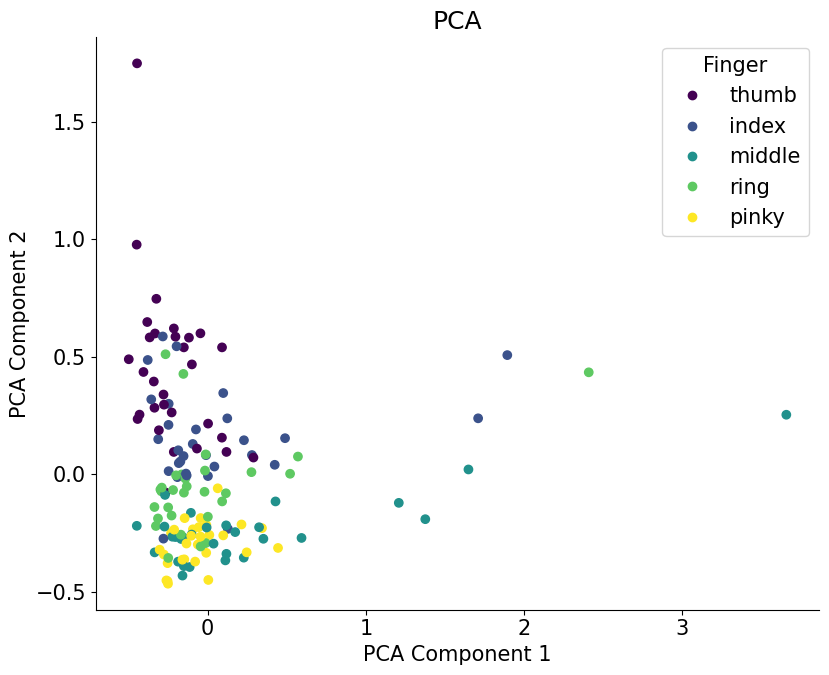

In [115]:
from sklearn.decomposition import PCA

def flatten_signals(signal_array):
    return signal_array.flatten()

# Crear una matriz de características para t-SNE
features = np.array(df_s0['V_preprocessed'].apply(flatten_signals).tolist())

# Aplicar PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(features)

# Añadir los resultados de PCA al DataFrame
df_s0['pca-2d-one'] = pca_results[:, 0]
df_s0['pca-2d-two'] = pca_results[:, 1]

# Visualizar los resultados de PCA
plt.figure(figsize=(16, 7))

plt.subplot(1, 2, 1)
scatter = plt.scatter(
    x=df_s0['pca-2d-one'],
    y=df_s0['pca-2d-two'],
    c=df_s0['stim_id'],  # Colorear por stim_id (dedo)
    cmap='viridis'
)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA')
handles, _ = scatter.legend_elements()
plt.legend(handles, ['thumb', 'index', 'middle', 'ring', 'pinky'], title="Finger")

c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\mateo\AppData\Local\Temp\ipykernel_29540\700693880.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_s0[f'tsne-2d-one-{perplexity}'] = tsne_results[:, 0]
C:\Users\mateo\AppData\Local\Temp\ipykernel_29540\700693880.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

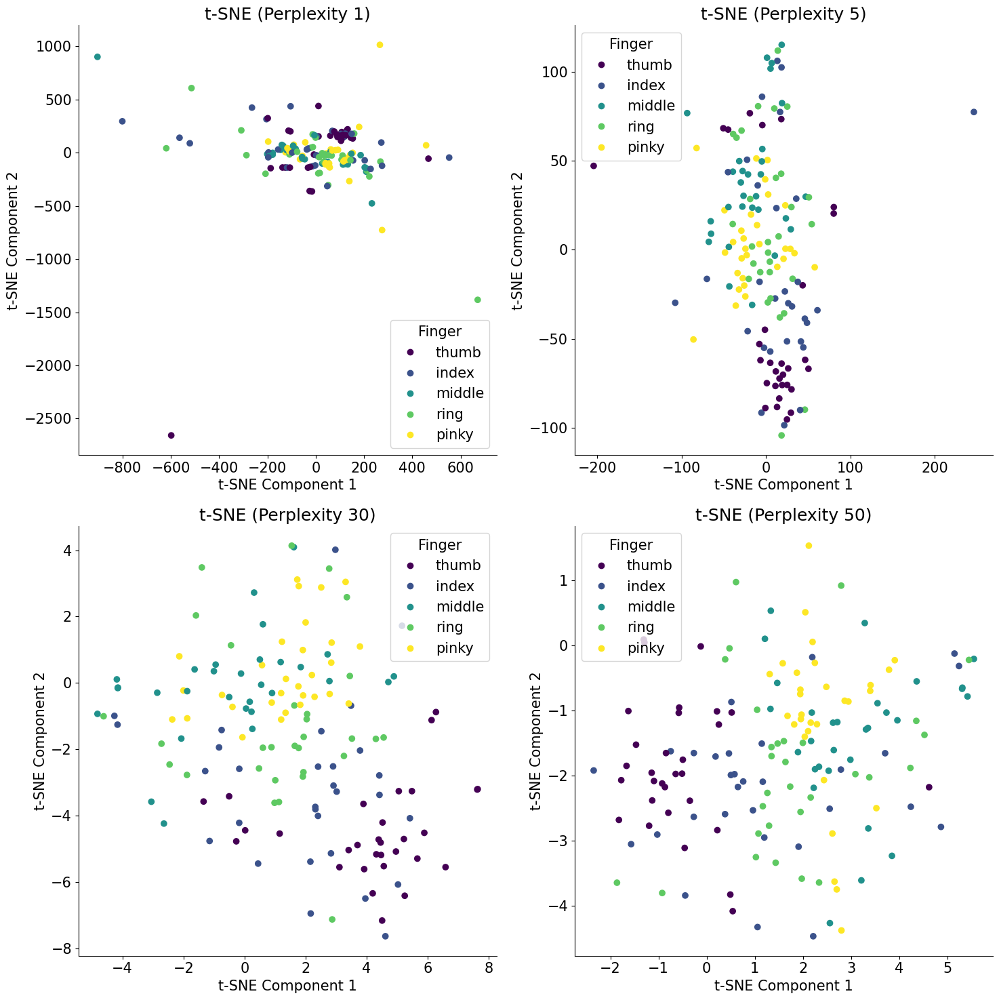

In [116]:
from sklearn.manifold import TSNE
# set seed
np.random.seed(420)

# Valores de perplexity a probar
perplexities = [1, 5, 30, 50]

# Aplicar t-SNE con diferentes valores de perplexity y visualizar los resultados
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
colors = ['b', 'g', 'r', 'c', 'm']
labels = ['thumb', 'index', 'middle', 'ring', 'pinky']

for i, perplexity in enumerate(perplexities):
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    tsne_results = tsne.fit_transform(features)
    
    # Añadir los resultados de t-SNE al DataFrame
    df_s0[f'tsne-2d-one-{perplexity}'] = tsne_results[:, 0]
    df_s0[f'tsne-2d-two-{perplexity}'] = tsne_results[:, 1]
    
    # Visualizar los resultados de t-SNE
    ax = axes[i // 2, i % 2]
    scatter = ax.scatter(
        x=df_s0[f'tsne-2d-one-{perplexity}'],
        y=df_s0[f'tsne-2d-two-{perplexity}'],
        c=df_s0['stim_id'],  # Colorear por stim_id (dedo)
        cmap='viridis'
    )
    ax.set_xlabel('t-SNE Component 1')
    ax.set_ylabel('t-SNE Component 2')
    ax.set_title(f't-SNE (Perplexity {perplexity})')
    
    # Añadir leyenda
    handles, _ = scatter.legend_elements()
    legend = ax.legend(handles, labels, title="Finger")

plt.tight_layout()
plt.show()

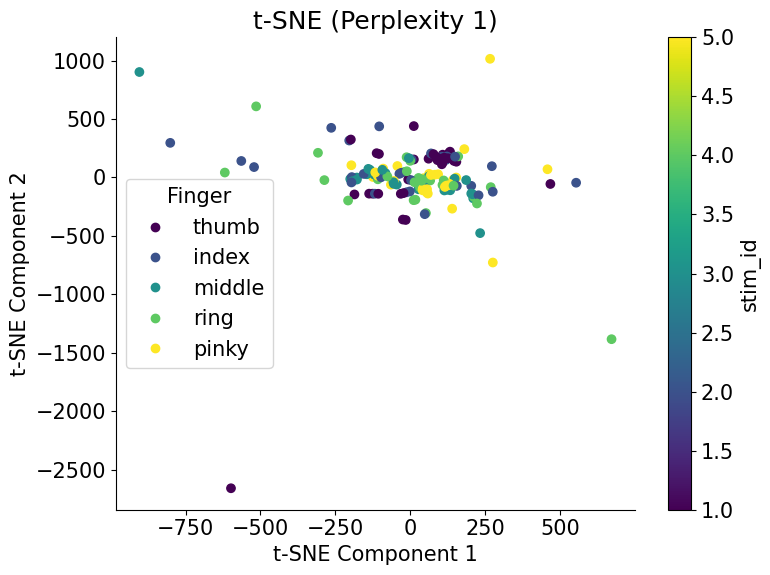

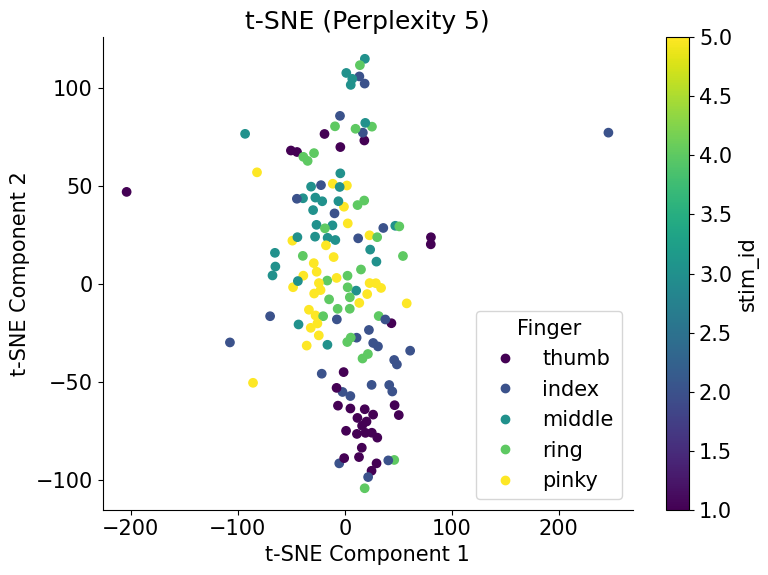

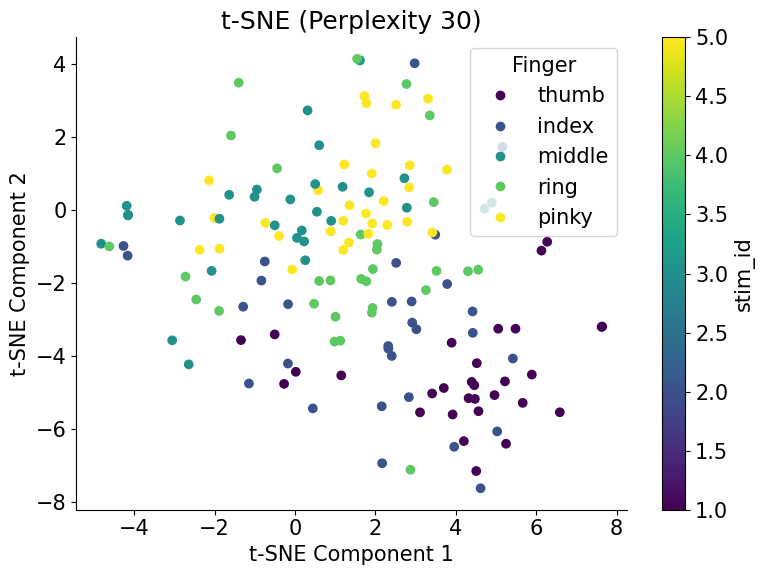

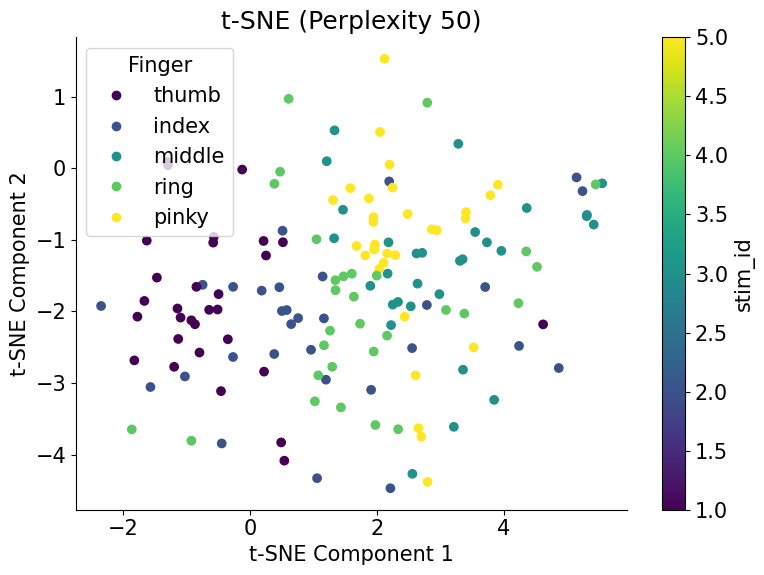

In [117]:

# Visualización de cada t-SNE por separado
for perplexity in perplexities:
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        x=df_s0[f'tsne-2d-one-{perplexity}'],
        y=df_s0[f'tsne-2d-two-{perplexity}'],
        c=df_s0['stim_id'],  # Colorear por stim_id (dedo)
        cmap='viridis'
    )
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f't-SNE (Perplexity {perplexity})')
    
    # Añadir leyenda
    handles, _ = scatter.legend_elements()
    plt.legend(handles, labels, title="Finger")
    
    plt.colorbar(label='stim_id')
    plt.show()


### Data NeuroLab

In [118]:
import pandas as pd
import os
import json

# Constantes
EEG_SAMPLING_RATE = 125  # Hz
EEG_COLUMNS = ['Fp1', 'Fp2', 'C3', 'C4', 'P7', 'P8', 'O1', 'O2', 'F7', 'F8', 'F3', 'F4', 'T7', 'T8', 'P3', 'P4']

def process_experiment(eeg_file, timestamps_file):
    # Extraer la información de la persona del nombre del archivo
    info = eeg_file.split('_')[-1].split('.')[0].split('-')
    name, sex, age, has_cat, has_dog, has_rabbit = info[:6]
    sex = 1 if sex.lower() == 'm' else 0
    has_cat = has_cat == 'y'
    has_dog = has_dog == 'y'
    has_rabbit = has_rabbit == 'y'

    # Cargar datos EEG
    eeg_df = pd.read_csv(eeg_file)

    # Cargar timestamps
    timestamps_df = pd.read_csv(timestamps_file, header=None, names=['Image', 'Timestamp'])

    # Add a column for end time of each image
    timestamps_df['EndTimestamp'] = timestamps_df['Timestamp'].shift(-1)
    
    #print(timestamps_df)
    # Procesar cada segmento de tiempo
    images_data = []
    for index, row in timestamps_df.iterrows():
        start_time = row['Timestamp']
        end_time = row['EndTimestamp'] if not pd.isna(row['EndTimestamp']) else timestamps_df['Timestamp'].iloc[-1]
        
        start_index = int(start_time * EEG_SAMPLING_RATE)
        end_index = int(end_time * EEG_SAMPLING_RATE)
        eeg_chunk = eeg_df.iloc[start_index:end_index].values.tolist()

        if 'no_stimuli' in row['Image']:
            chunk_label = 'no_stimuli'
        else:
            chunk_label = row['Image'].split('/')[2]  # Extract category from the path

        images_data.append({
            "file_path": row['Image'],
            "class": chunk_label,
            "EEG_signal": eeg_chunk
        })

    return {
        "name": name,
        "sex": sex,
        "age": int(age),
        "has_cat": has_cat,
        "has_dog": has_dog,
        "has_rabbit": has_rabbit,
        "view_images": images_data
    }

def consolidate_data(directory):
    all_data = {"subjects": []}
    for filename in os.listdir(directory):
        if filename.startswith("output_file"):
            eeg_file = os.path.join(directory, filename)
            timestamps_file = os.path.join(directory, filename.replace("output_file", "timestamps"))
            person_data = process_experiment(eeg_file, timestamps_file)
            all_data["subjects"].append(person_data)
    return all_data

# Uso de la función para consolidar datos
directory = "SynapSee_data"  # Directorio donde están los archivos
consolidated_data = consolidate_data(directory)

# Guardar los datos consolidados en un archivo JSON
with open('SynapSee_data.json', 'w') as json_file:
    json.dump(consolidated_data, json_file)



In [119]:
import json
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

class EEGDataset(Dataset):
    # Define a mapping from class labels to integers as a class attribute
    class_mapping = {'cat': 0, 'dog': 1, 'rabbit': 2, 'control': 3}

    def __init__(self, json_file, SEGMENT_LENGTH=123):
        with open(json_file, 'r') as file:
            data = json.load(file)

        self.data = []
        for subject in data['subjects']:
            for image in subject['view_images']:
                image_class = image['class']

                # Exclude samples with class 'no_stimuli'
                if image_class == 'no_stimuli':
                    continue

                # Map the class label to an integer
                class_int = self.class_mapping.get(image_class, -1)  # Default to -1 for unknown classes

                eeg_signal = image['EEG_signal']
                # Segment the EEG signal
                for i in range(0, len(eeg_signal), SEGMENT_LENGTH):
                    segment = eeg_signal[i:i + SEGMENT_LENGTH]
                    if len(segment) == SEGMENT_LENGTH:
                        self.data.append({
                            "subject": subject['name'],
                            "EEG_signal": segment,
                            "class": class_int,  # Use the integer label
                            "age": subject['age'],
                            "sex": subject['sex'],
                            "has_cat": subject['has_cat'],
                            "has_dog": subject['has_dog'],
                            "has_rabbit": subject['has_rabbit']
                        })

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        eeg_signal = torch.tensor(item['EEG_signal'], dtype=torch.float)
        return {
            "eeg_signal": eeg_signal,
            "class": item['class'],
            "subject": item['subject'],
            "age": item['age'],
            "sex": item['sex'],
            "has_cat": item['has_cat'],
            "has_dog": item['has_dog'],
            "has_rabbit": item['has_rabbit']
        }

# empty dataframe
synapsee_dataset = EEGDataset('SynapSee_data.json')


In [120]:
print("Class mapping:", synapsee_dataset.class_mapping)
print("Number of samples:", len(synapsee_dataset))
print("Sample keys:", synapsee_dataset[0].keys())
print("Sample signal shape:", synapsee_dataset[0]['eeg_signal'].shape)
synapsee_dataset[0]

Class mapping: {'cat': 0, 'dog': 1, 'rabbit': 2, 'control': 3}
Number of samples: 7124
Sample keys: dict_keys(['eeg_signal', 'class', 'subject', 'age', 'sex', 'has_cat', 'has_dog', 'has_rabbit'])
Sample signal shape: torch.Size([123, 16])


{'eeg_signal': tensor([[-24338.7695,  -5664.2896, -88717.7188,  ..., -63905.0898,
          -82519.1328, -54128.3906],
         [-24349.2754,  -5675.5996, -88728.5391,  ..., -63888.7734,
          -82503.0156, -54090.4180],
         [-24375.7168,  -5710.3120, -88757.2578,  ..., -63907.5273,
          -82524.9219, -54113.8633],
         ...,
         [-24175.4453,  -5633.2207, -88709.3594,  ..., -63877.2383,
          -82471.5859, -54085.3203],
         [-24171.6465,  -5628.5269, -88718.7031,  ..., -63877.6211,
          -82475.7031, -54095.9844],
         [-24175.6016,  -5632.6841, -88712.8906,  ..., -63882.0469,
          -82479.1406, -54089.6133]]),
 'class': 0,
 'subject': 'andy',
 'age': 24,
 'sex': 0,
 'has_cat': False,
 'has_dog': True,
 'has_rabbit': False}

In [121]:
%%time
# if SynapSee_tsne_results.csv not found run the code 
if not os.path.isfile('SynapSee_tsne_results.csv'):
    # Aplicar t-SNE con diferentes valores de perplexity
    tsne_results_dict = {}
    for perplexity in perplexities:
        tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
        tsne_results = tsne.fit_transform(eeg_signals)
        tsne_results_dict[perplexity] = tsne_results

    # Crear un DataFrame para almacenar los resultados de t-SNE y atributos adicionales
    df_tsne = pd.DataFrame({
        'subject': subjects,
        'class': labels,
        'sex': sexes,
        'has_cat': animal_ownership[:, 0],
        'has_dog': animal_ownership[:, 1],
        'has_rabbit': animal_ownership[:, 2]
    })


    # Añadir resultados de t-SNE al DataFrame
    for perplexity in perplexities:
        df_tsne[f'tsne-2d-one-{perplexity}'] = tsne_results_dict[perplexity][:, 0]
        df_tsne[f'tsne-2d-two-{perplexity}'] = tsne_results_dict[perplexity][:, 1]

    #save df to csv
    df_tsne.to_csv('SynapSee_tsne_results.csv', index=False)
    
else: 
    df_tsne = pd.read_csv('SynapSee_tsne_results.csv')

CPU times: total: 0 ns
Wall time: 82.9 ms


In [122]:
# Extraer señales EEG, etiquetas de clase y atributos adicionales
eeg_signals = []
labels = []
subjects = []

for sample in synapsee_dataset:
    eeg_signals.append(sample['eeg_signal'].numpy().flatten())  # Aplanar las señales EEG
    labels.append(sample['class'])
    subjects.append(sample['subject'])

# Convertir a arrays de numpy
eeg_signals = np.array(eeg_signals)
labels = np.array(labels)
subjects = np.array(subjects)

# Mapeo de sujetos a colores
subject_colors = {
    'andy': 'b',
    'dani': 'g',
    'mateo': 'r',
    'muri': 'c',
    'pato': 'm',
    'pato2': 'y'
}

# Mapeo de clases a marcadores
class_markers = {
    0: 'o',  # cat
    1: '^',  # dog
    2: 'p',  # rabbit
    3: '*'   # control
}

# Mapeo de clases a colores
class_colors = {
    0: 'b',  # cat
    1: 'g',  # dog
    2: 'r',  # rabbit
    3: 'c'   # control
}

c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


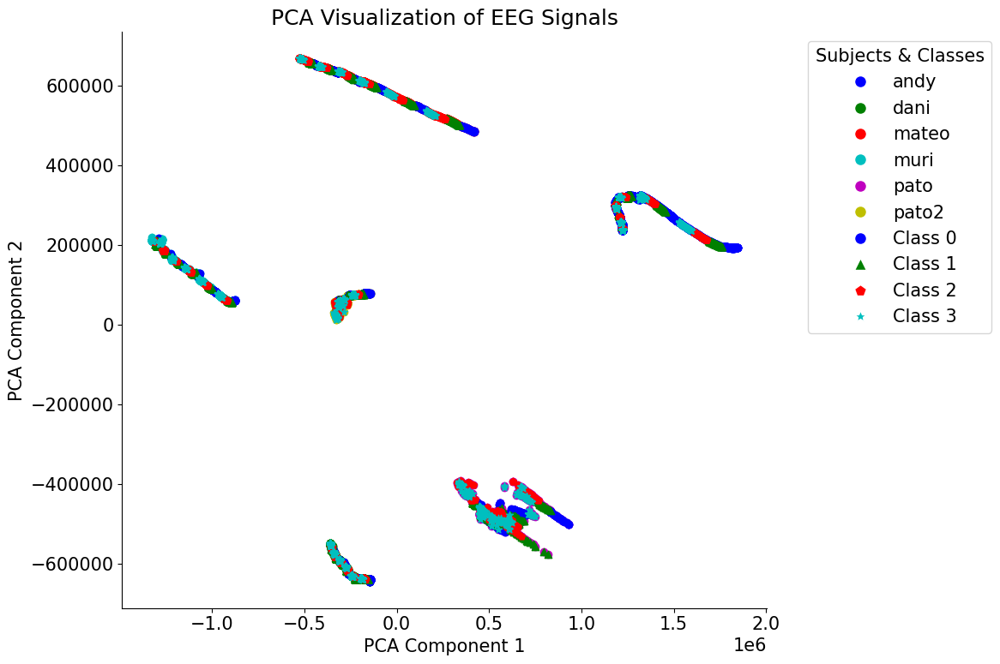

CPU times: total: 562 ms
Wall time: 561 ms


In [123]:
%%time
# Aplicar PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(eeg_signals)  # Asumiendo que eeg_signals está definido previamente

# Visualización de PCA
plt.figure(figsize=(12, 8))
for subject in np.unique(subjects):
    idx = subjects == subject
    plt.scatter(
        pca_results[idx, 0], pca_results[idx, 1], 
        c=subject_colors[subject], label=subject,
        edgecolor=subject_colors[subject]  # Borde del mismo color que el punto
    )

for label in np.unique(labels):
    idx = labels == label
    plt.scatter(
        pca_results[idx, 0], pca_results[idx, 1],
        marker=class_markers[label], color=class_colors[label],
        edgecolor=class_colors[label]  # Borde del mismo color que el punto
    )

# Crear leyenda para sujetos y clases
subject_legend = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=sub) for sub, color in subject_colors.items()]
class_legend = [Line2D([0], [0], marker=class_markers[cls], color='w', markerfacecolor=class_colors[cls], markersize=10, label=f'Class {cls}') for cls in class_markers.keys()]
plt.legend(handles=subject_legend + class_legend, title="Subjects & Classes", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA Visualization of EEG Signals')
plt.show()

c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


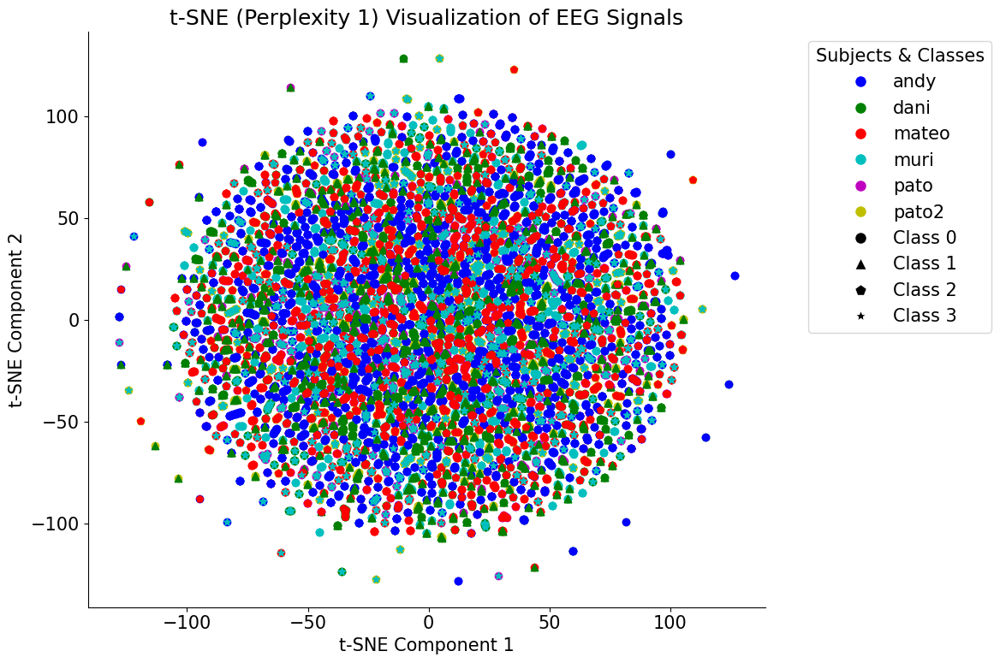

c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


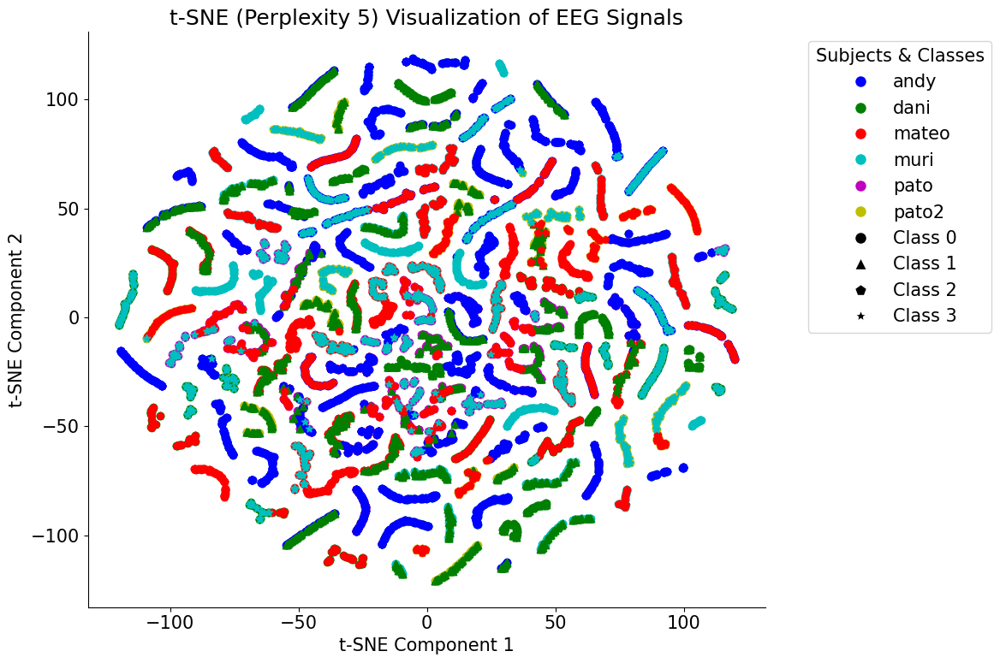

c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


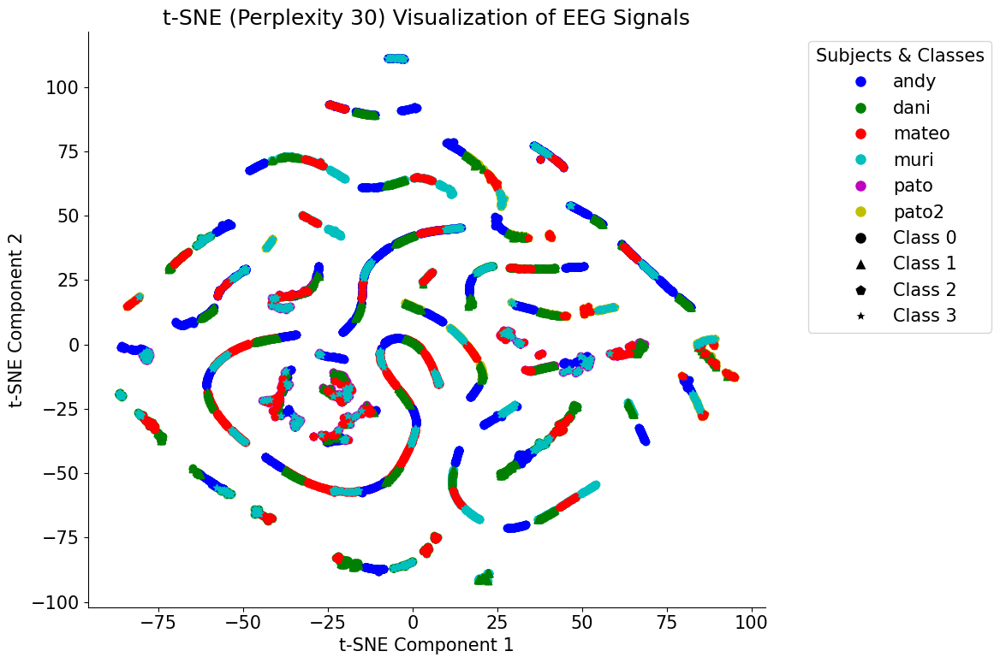

c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


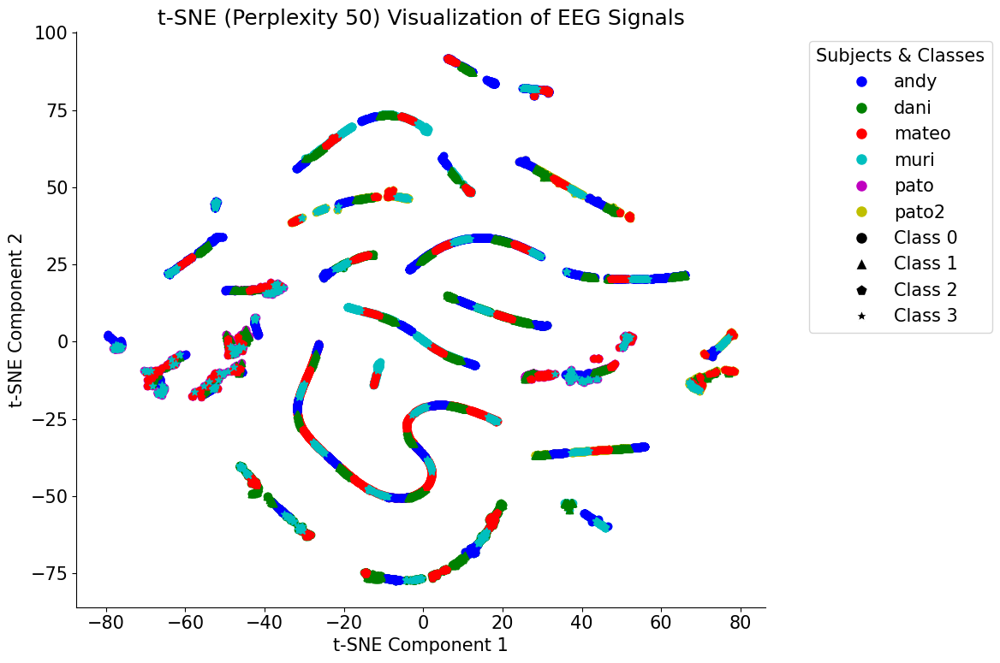

CPU times: total: 6min 2s
Wall time: 1min 13s


In [124]:
%%time
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
# Aplicar t-SNE con diferentes valores de perplexity y visualizar los resultados
for perplexity in perplexities:
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    tsne_results = tsne.fit_transform(eeg_signals)

    plt.figure(figsize=(12, 8))
    for subject in np.unique(subjects):
        idx = subjects == subject
        plt.scatter(
            tsne_results[idx, 0], tsne_results[idx, 1], 
            c=subject_colors[subject], label=subject,
            edgecolor=subject_colors[subject]  # Hacer que el borde sea del mismo color que el punto
        )

    for label in np.unique(labels):
        idx = labels == label
        plt.scatter(
            tsne_results[idx, 0], tsne_results[idx, 1], 
            marker=class_markers[label], color=class_colors[label],
            edgecolor=class_colors[label]  # Hacer que el borde sea del mismo color que el punto
        )

    # Crear leyenda para sujetos y clases
    subject_legend = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=sub) for sub, color in subject_colors.items()]
    class_legend = [Line2D([0], [0], marker=class_markers[cls], color='w', markerfacecolor='k', markersize=10, label=f'Class {cls}') for cls in class_markers.keys()]
    plt.legend(handles=subject_legend + class_legend, title="Subjects & Classes", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f't-SNE (Perplexity {perplexity}) Visualization of EEG Signals')
    plt.show()
warnings.simplefilter(action='default', category=FutureWarning)

# Viz no utilizadas

-----

In [125]:
%%time
eeg_signals = []
labels = []
subjects = []
sexes = []
animal_ownership = []

for sample in synapsee_dataset:
    eeg_signals.append(sample['eeg_signal'].numpy().flatten())  # Aplanar las señales EEG
    labels.append(sample['class'])
    subjects.append(sample['subject'])
    sexes.append(sample['sex'])
    animal_ownership.append((sample['has_cat'], sample['has_dog'], sample['has_rabbit']))  # Tuple for animal ownership

# Convertir a arrays de numpy
eeg_signals = np.array(eeg_signals)
labels = np.array(labels)
subjects = np.array(subjects)
sexes = np.array(sexes)
animal_ownership = np.array(animal_ownership)


CPU times: total: 922 ms
Wall time: 1.22 s


In [126]:
#save df to csv
df_tsne.to_csv('SynapSee_tsne_results.csv', index=False)

In [127]:
# Mapeo de sujetos a colores
subject_colors = {
    'andy': 'b',
    'dani': 'g',
    'mateo': 'r',
    'muri': 'c',
    'pato': 'm',
    'pato2': 'y'
}

# Mapeo de clases a colores
class_colors = {
    0: 'b',  # cat
    1: 'g',  # dog
    2: 'r',  # rabbit
    3: 'c'   # control
}

# Definir función para obtener marcador basado en posesión de animales
def get_marker(has_cat, has_dog):
    if has_dog:
        return 's'  # square
    elif has_cat:
        return '^'  # triangle
    else:
        return 'o'  # circle

c:\Users\mateo\anaconda3\envs\itam\Lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


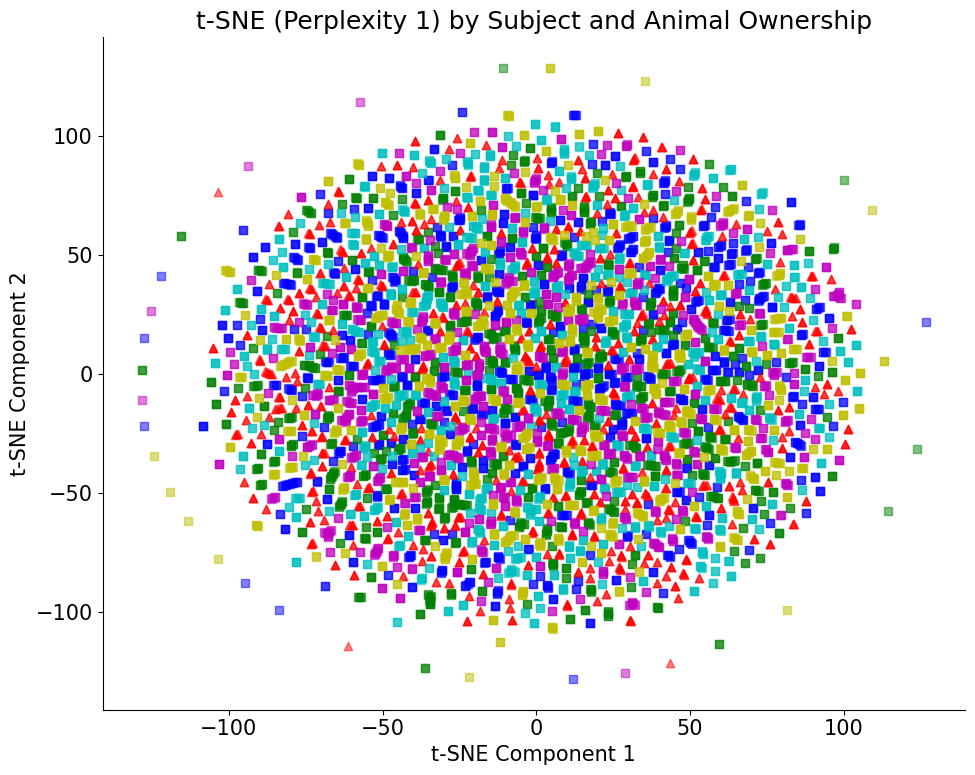

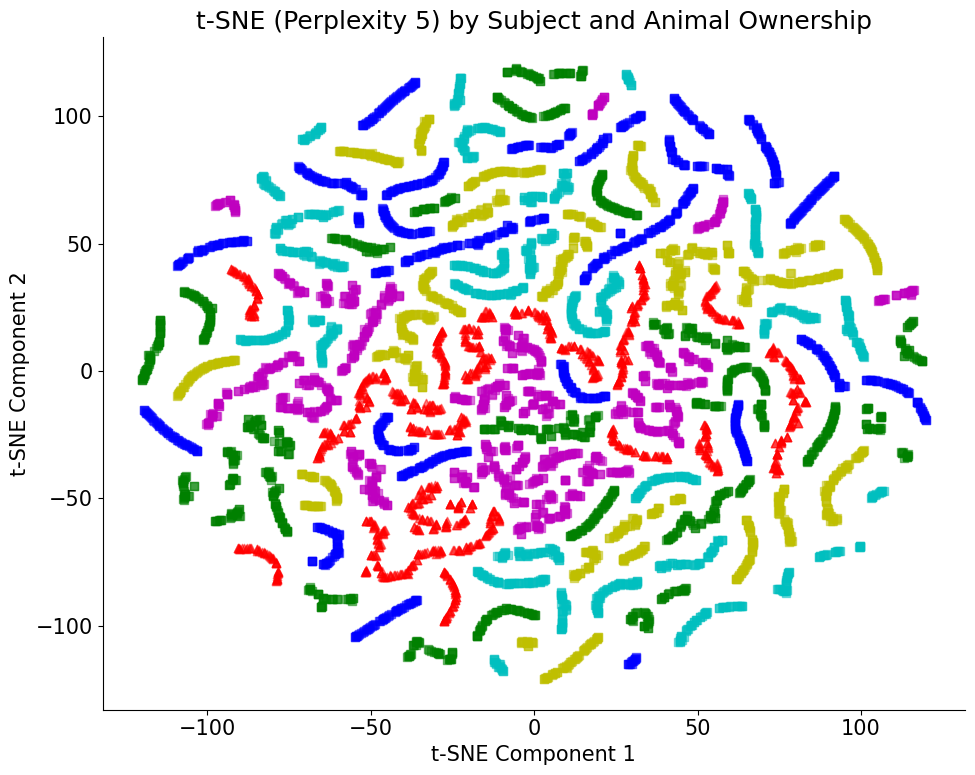

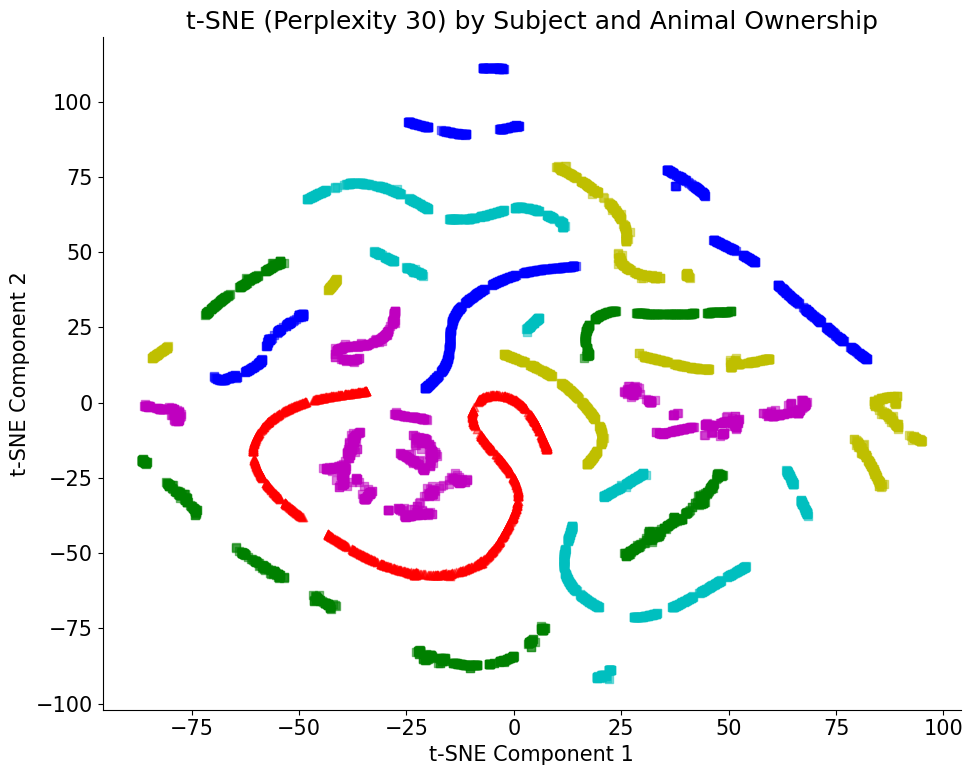

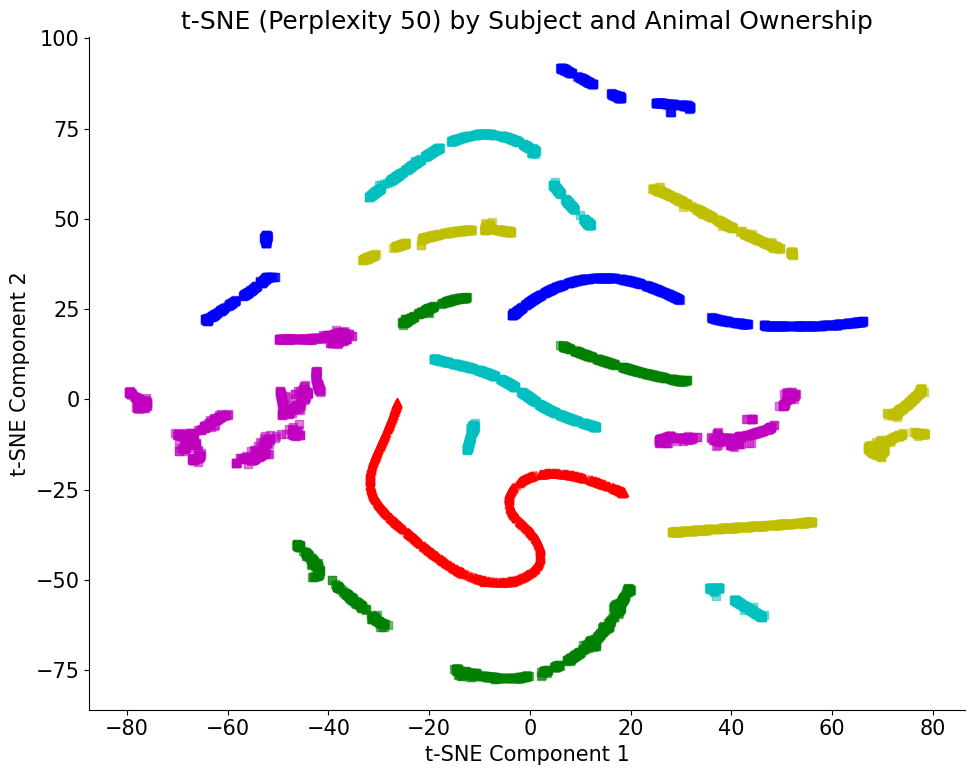

In [128]:
# Visualización de t-SNE para cada perplexity con atributos adicionales
for perplexity in perplexities:
    plt.figure(figsize=(10, 8))
    for subject in subject_colors.keys():
        subset = df_tsne[df_tsne['subject'] == subject]
        for _, row in subset.iterrows():
            marker = get_marker(row['has_cat'], row['has_dog'])
            plt.scatter(
                x=row[f'tsne-2d-one-{perplexity}'],
                y=row[f'tsne-2d-two-{perplexity}'],
                color=subject_colors[subject],
                marker=marker,
                alpha=0.5
            )
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f't-SNE (Perplexity {perplexity}) by Subject and Animal Ownership')
    plt.show()

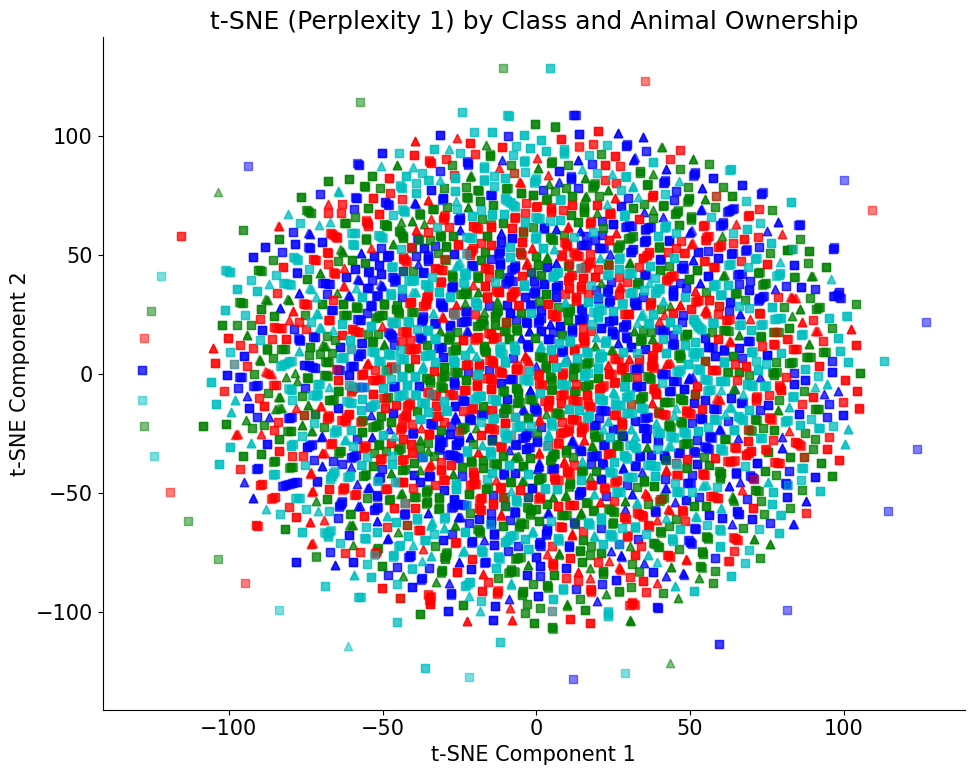

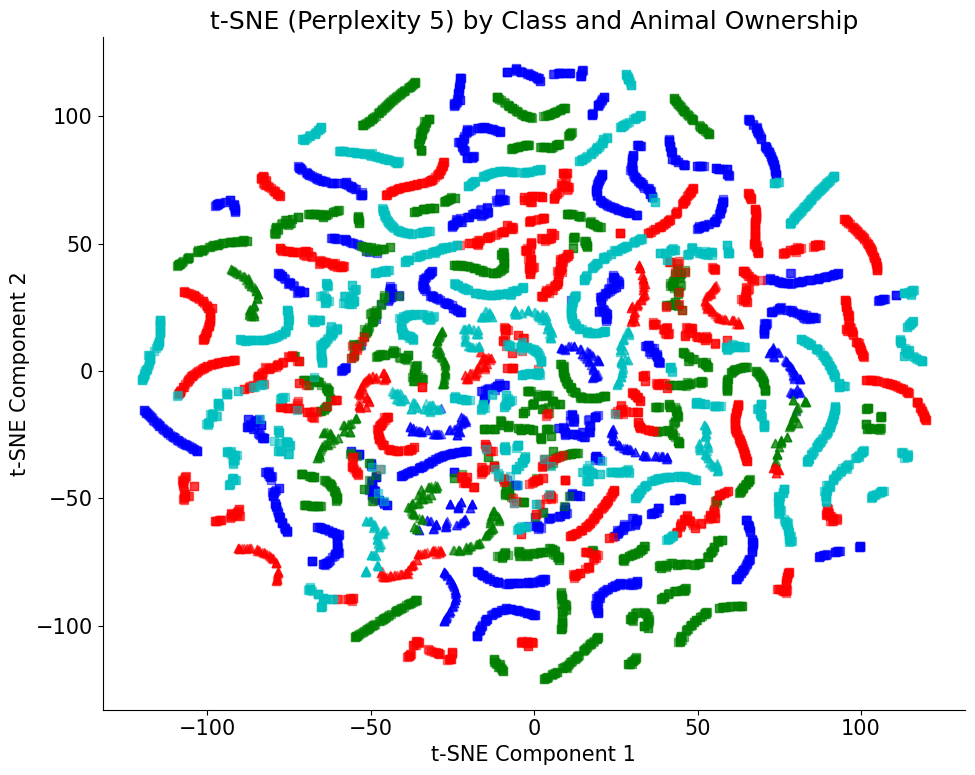

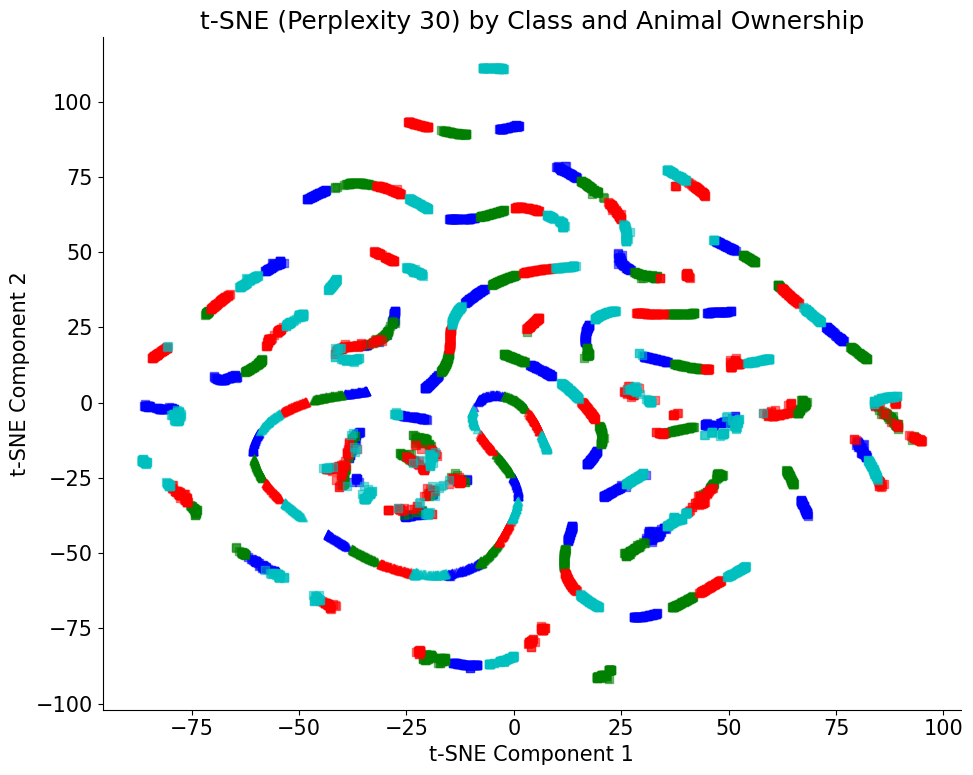

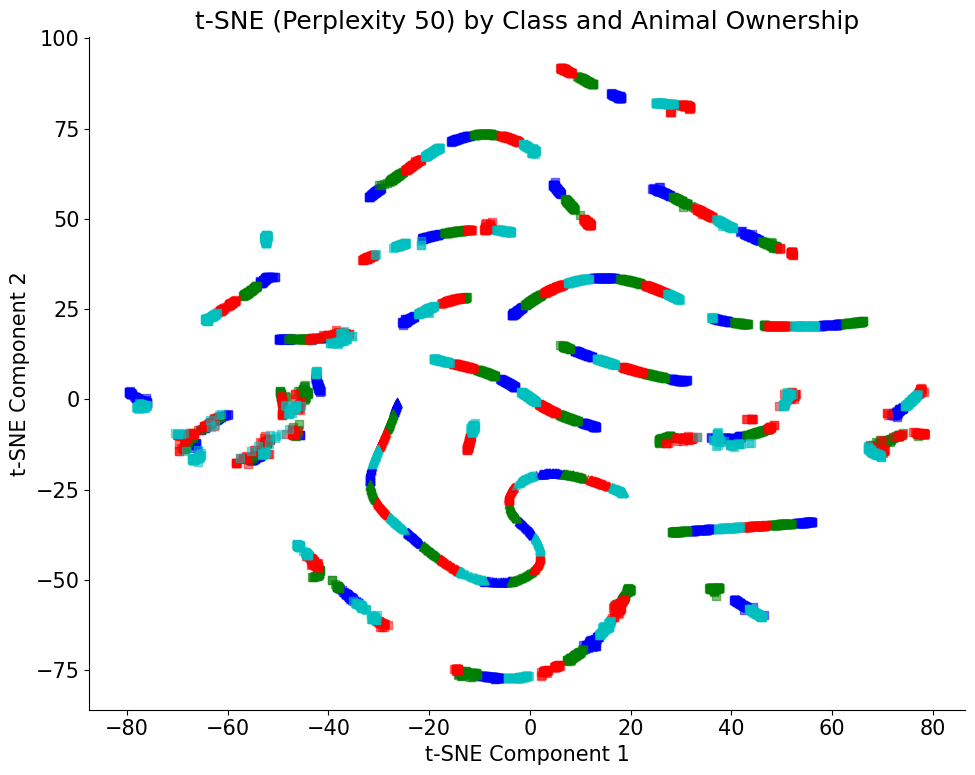

In [129]:
# Visualización de t-SNE para cada perplexity con color por clase
for perplexity in perplexities:
    plt.figure(figsize=(10, 8))
    for class_id in class_colors.keys():
        subset = df_tsne[df_tsne['class'] == class_id]
        for _, row in subset.iterrows():
            marker = get_marker(row['has_cat'], row['has_dog'])
            plt.scatter(
                x=row[f'tsne-2d-one-{perplexity}'],
                y=row[f'tsne-2d-two-{perplexity}'],
                color=class_colors[class_id],
                marker=marker,
                alpha=0.5
            )
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f't-SNE (Perplexity {perplexity}) by Class and Animal Ownership')
    plt.show()

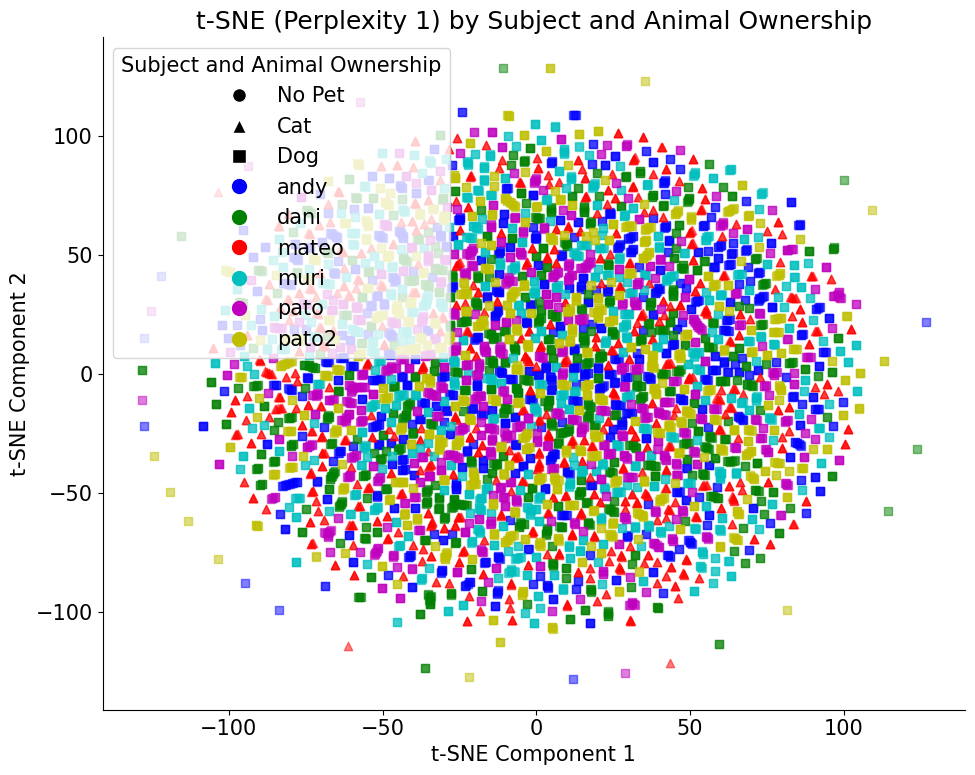

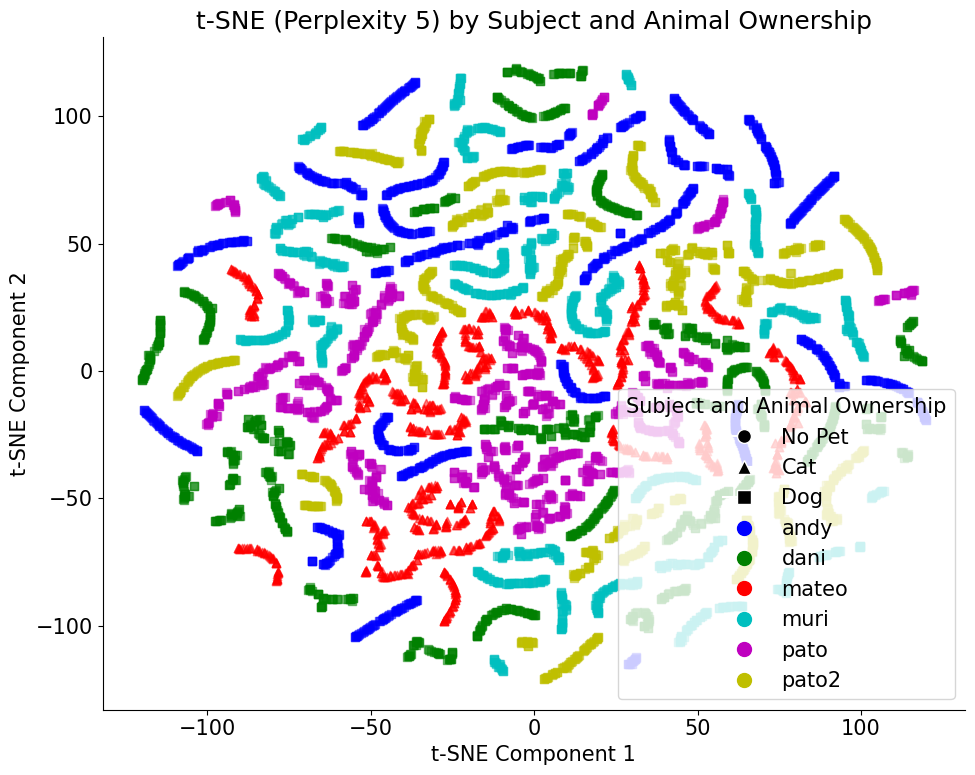

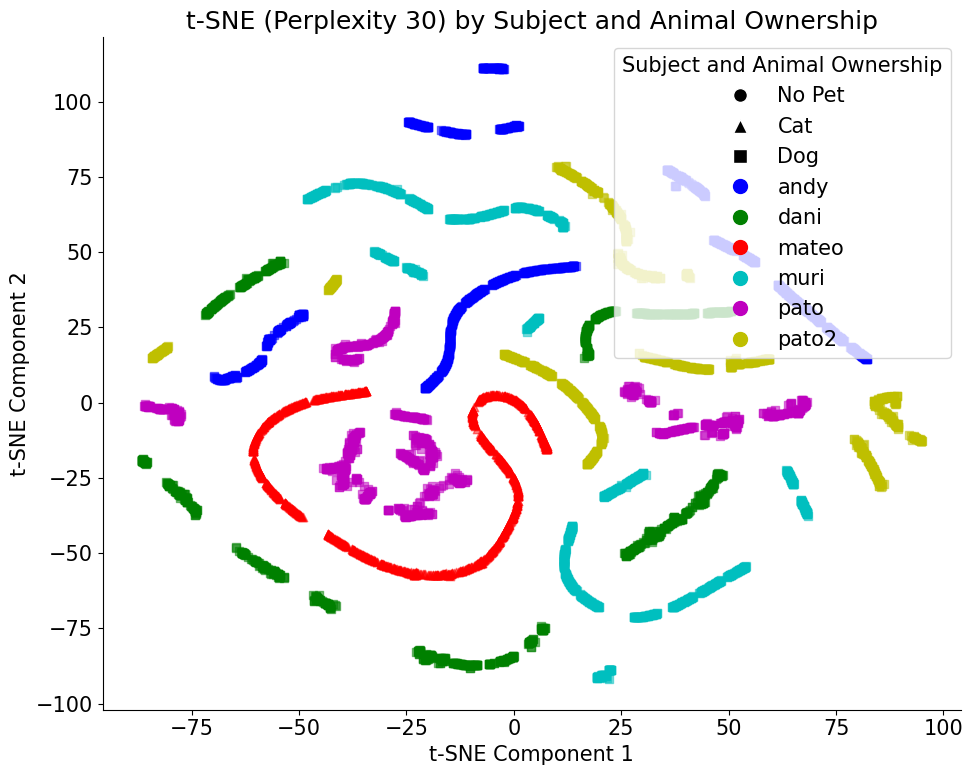

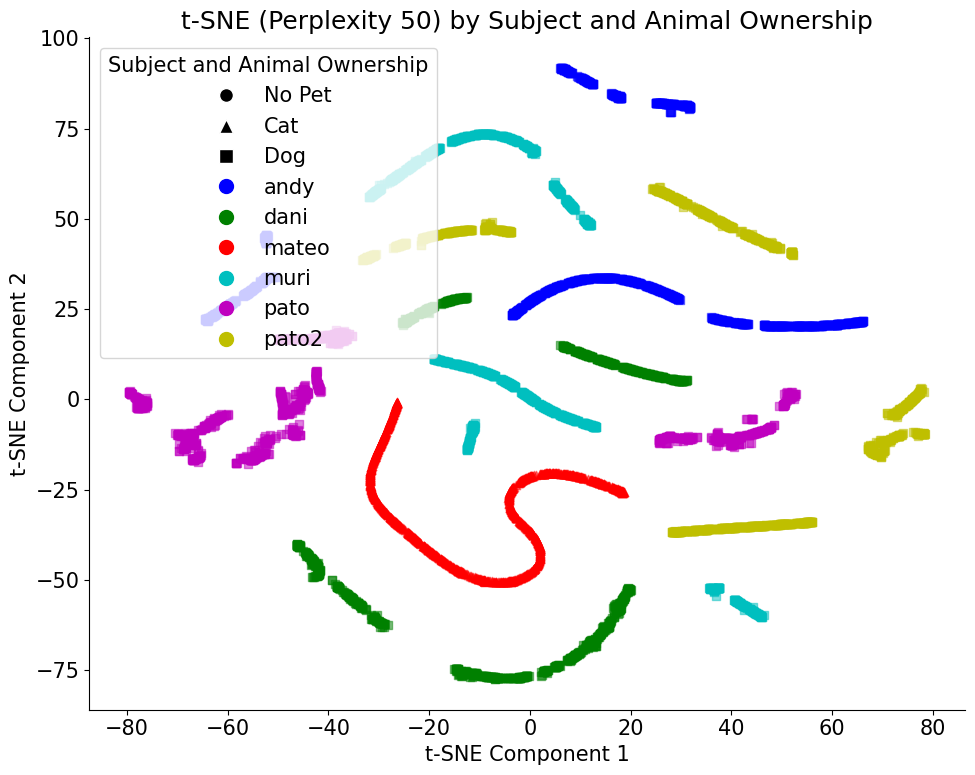

CPU times: total: 3min 21s
Wall time: 4min 21s


In [130]:
%%time
# Visualización de t-SNE para cada perplexity con atributos adicionales
for perplexity in perplexities:
    plt.figure(figsize=(10, 8))
    for subject in subject_colors.keys():
        subset = df_tsne[df_tsne['subject'] == subject]
        for _, row in subset.iterrows():
            marker = get_marker(row['has_cat'], row['has_dog'])
            plt.scatter(
                x=row[f'tsne-2d-one-{perplexity}'],
                y=row[f'tsne-2d-two-{perplexity}'],
                color=subject_colors[subject],
                marker=marker,
                alpha=0.5,
                label=f'{subject} - {marker}'  # Añadir leyenda para cada sujeto y marcador
            )
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f't-SNE (Perplexity {perplexity}) by Subject and Animal Ownership')
    
    # Crear leyenda personalizada
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='k', markersize=10, label='No Pet'),
        Line2D([0], [0], marker='^', color='w', markerfacecolor='k', markersize=10, label='Cat'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='k', markersize=10, label='Dog')
    ] + [
        Line2D([0], [0], marker='o', color=color, markersize=10, linestyle='None', label=subject) for subject, color in subject_colors.items()
    ]
    plt.legend(handles=legend_elements, title="Subject and Animal Ownership")
    plt.show()

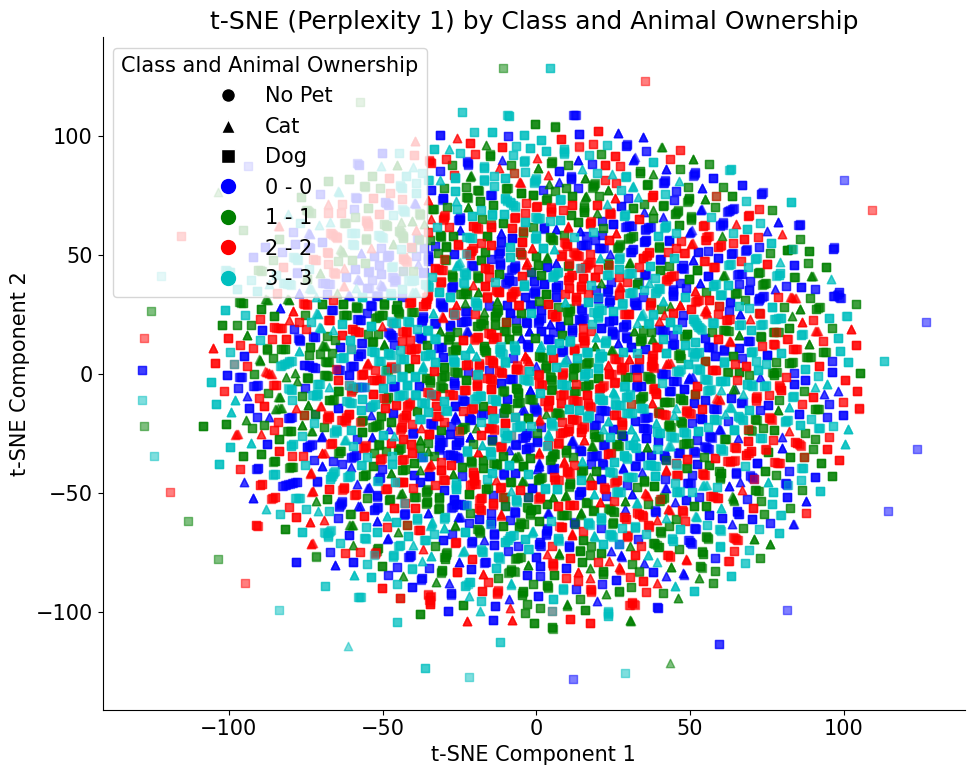

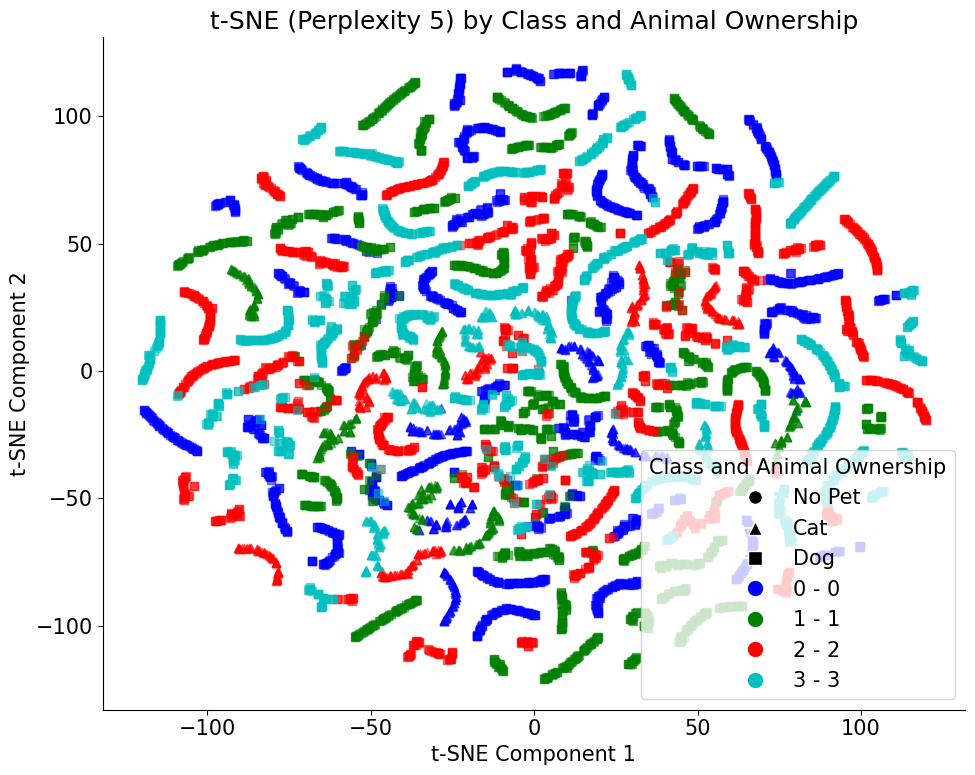

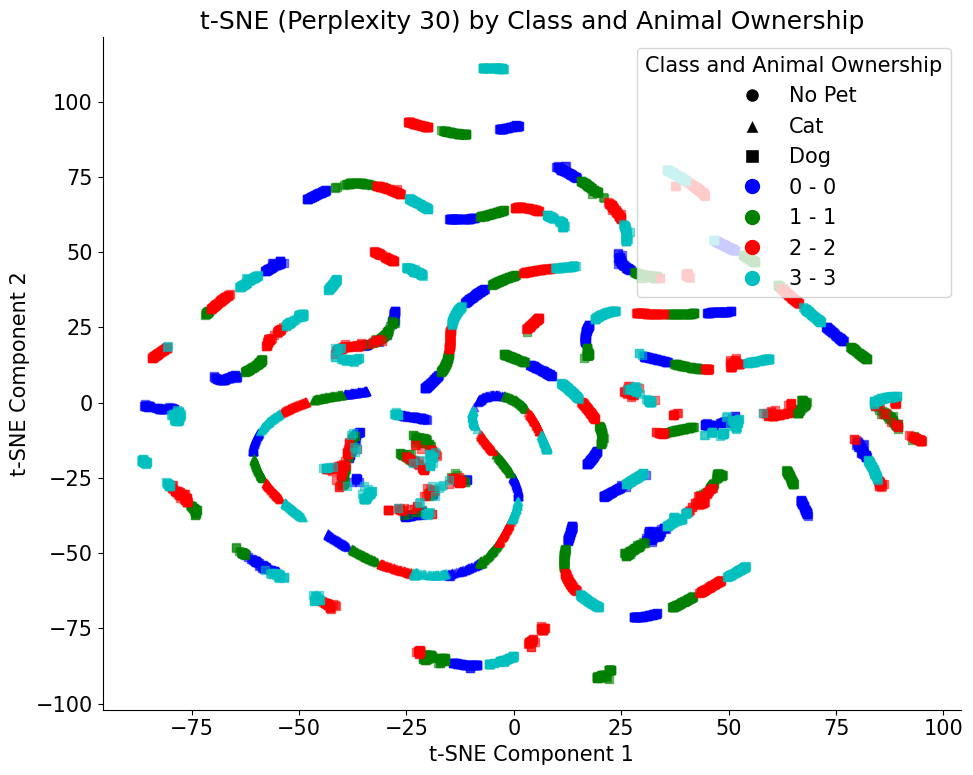

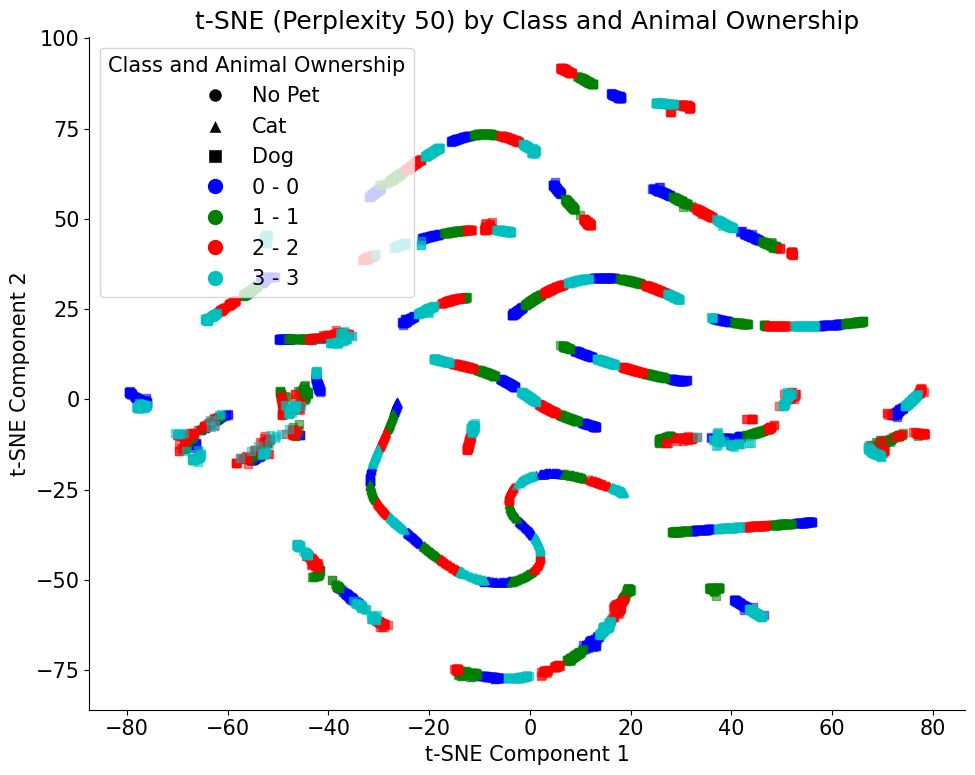

CPU times: total: 3min 18s
Wall time: 4min 11s


In [131]:
%%time
# Visualización de t-SNE para cada perplexity con color por clase
for perplexity in perplexities:
    plt.figure(figsize=(10, 8))
    for class_id in class_colors.keys():
        subset = df_tsne[df_tsne['class'] == class_id]
        for _, row in subset.iterrows():
            marker = get_marker(row['has_cat'], row['has_dog'])
            plt.scatter(
                x=row[f'tsne-2d-one-{perplexity}'],
                y=row[f'tsne-2d-two-{perplexity}'],
                color=class_colors[class_id],
                marker=marker,
                alpha=0.5,
                label=f'{class_id} - {marker}'  # Añadir leyenda para cada clase y marcador
            )
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f't-SNE (Perplexity {perplexity}) by Class and Animal Ownership')
    
    # Crear leyenda personalizada
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='k', markersize=10, label='No Pet'),
        Line2D([0], [0], marker='^', color='w', markerfacecolor='k', markersize=10, label='Cat'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='k', markersize=10, label='Dog')
    ] + [
        Line2D([0], [0], marker='o', color=color, markersize=10, linestyle='None', label=f'{class_id} - {label}') for class_id, (label, color) in enumerate(class_colors.items())
    ]
    plt.legend(handles=legend_elements, title="Class and Animal Ownership")
    plt.show()